In [7]:
import os

try:
  import google.colab
  IN_COLAB = True
except:
  IN_COLAB = False

print("in colab?", IN_COLAB)

if IN_COLAB:
    from google.colab import drive
    drive.mount("/content/drive/")
    os.chdir('/content/drive/MyDrive/Denoise/cxr-experiment')
    !pwd # print current path
    # Install non-standard colab dependencies.
    !pip install torchinfo
    !pip install torchmetrics
    !pip install torchxrayvision
import copy
import torch
import numpy as np
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from PIL import Image, ImageFile
import requests
from io import BytesIO
from IPython.display import display
import matplotlib.pyplot as plt
import torchvision.models as models
import time
from torchvision.io import read_image
from torch.utils.data import Dataset
import time
import datetime
import pickle
import os
import torchxrayvision as xrv
import oxr_utils as oxr

# after !pip install (in case of colab)
from torchmetrics.image import StructuralSimilarityIndexMeasure, PeakSignalNoiseRatio
import torchinfo

from tqdm.autonotebook import tqdm
from torch.utils.data import DataLoader

torch.cuda.empty_cache()

# Select device
device = "str"#torch.device("cpu")
if torch.cuda.is_available():
    device = "cuda"#torch.device("cuda")
    torch.cuda.empty_cache()

print("Device: {}".format(device))

# util functions
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)


from oxr_utils import *

in colab? False
Device: cuda


In [8]:
if IN_COLAB:
    # USE THIS BLOCK COPIES THE NIH DATASET TO LOCAL COLAB INSTANCE AND IMPORTS THE NIH DATASET
    import zipfile
    import os
    from google.colab import drive
    drive.mount('/content/drive/')

    NIH_DATA_PATH = "/content/data/NIH_data"
    DRIVE_PATH = "/content/drive/MyDrive/Datasets"
    drive.mount('/content/drive/')

    zip_ref = zipfile.ZipFile(f"{DRIVE_PATH}/NIH_data.zip", 'r')
    if not os.path.exists(NIH_DATA_PATH):
      print("data path does not exist")
      zip_ref.extractall("/content/data") # can take 10-20min, but will make access very fast (30+ imgs/s)
      zip_ref.close()

    # Import NIH_Dataset class
    #NOTEBOOK_PATH = os.getcwd() # copy the dataset class file to the cwd
    #os.system(f"cp {DRIVE_PATH}/nih_dataset.py {NOTEBOOK_PATH}")

else: 
   NIH_DATA_PATH = "../data/NIH_data" # local path to the NIH dataset # Desktop

print("NIH_DATA_PATH: ", NIH_DATA_PATH)

NIH_DATA_PATH:  ../data/NIH_data


In [13]:

import oxr_utils as oxr
import matplotlib.pyplot as plt
import torch
import torch.utils.data
import torch.nn as nn

dataset = oxr.NIH_Dataset(NIH_DATA_PATH, split="test")
pathologies = dataset.pathologies
dataset = torch.utils.data.Subset(dataset, range(16)) # only use 2 images for testing
tester = oxr.NihTester(dataset)
camera_approx = oxr.CameraApprox(1.0)
median_filter_5 = oxr.MedianFilter(5)
median_filter_3 = oxr.MedianFilter(3)




import torch
bundle = torch.load("models/unet-s2k8_zke_bundle.pth")
#bundle = torch.load("models/unet-s4k32_dsb_bundle.pth")
model = ResUNet(s=bundle["metadata"]["s"], k=bundle["metadata"]["k"],)
model.load_state_dict(bundle["model_state"])

class ResModelWrapper(nn.Module):
    def __init__(self, model):
        super(ResModelWrapper, self).__init__()
        self.model = model

    def forward(self, x):
        return x + self.model(x)

res_unet = ResModelWrapper(model)

# list of denoisers
denoise_methods = {
    "median(k=3)": median_filter_3,
    "median(k=5)": median_filter_5,
    "camera_inverse": oxr.CamearApproxInverse(camera_approx),
    "camera_inverse_median(k=5)": nn.Sequential(oxr.CamearApproxInverse(camera_approx), median_filter_5),
    "camera_median(k=5)_inverse": nn.Sequential(median_filter_5, oxr.CamearApproxInverse(camera_approx)),
    "ResUNet": res_unet,
}



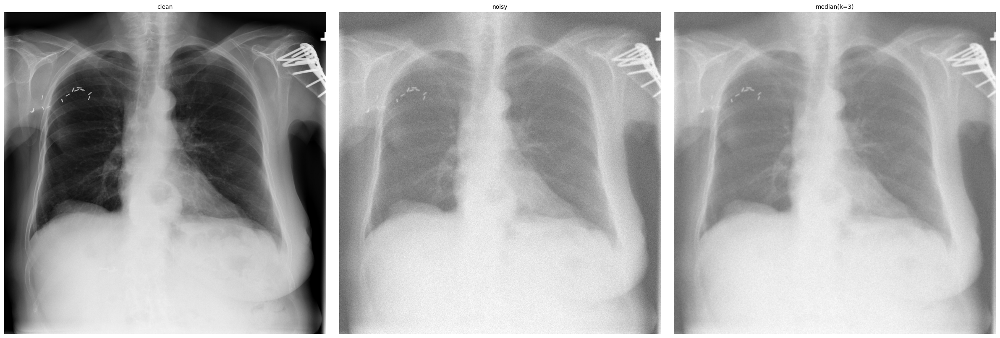

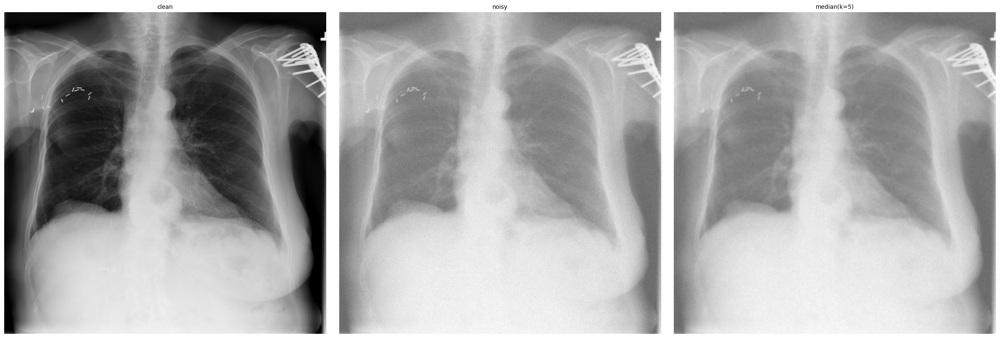

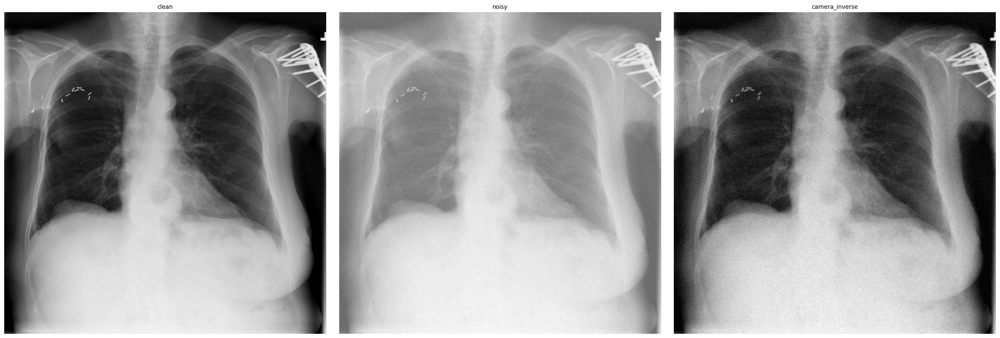

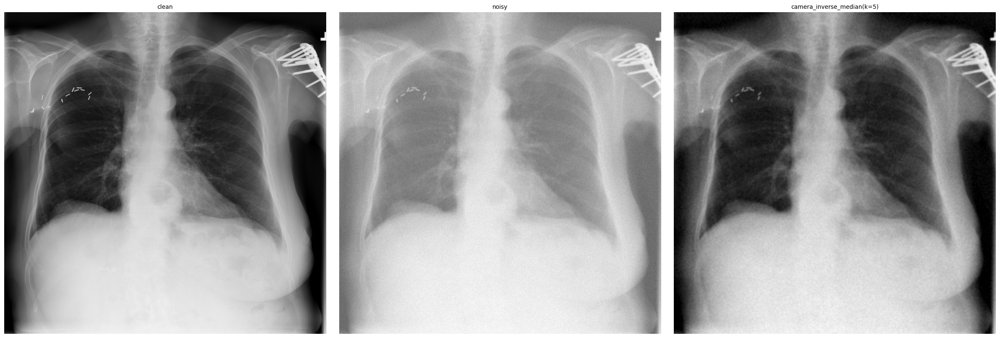

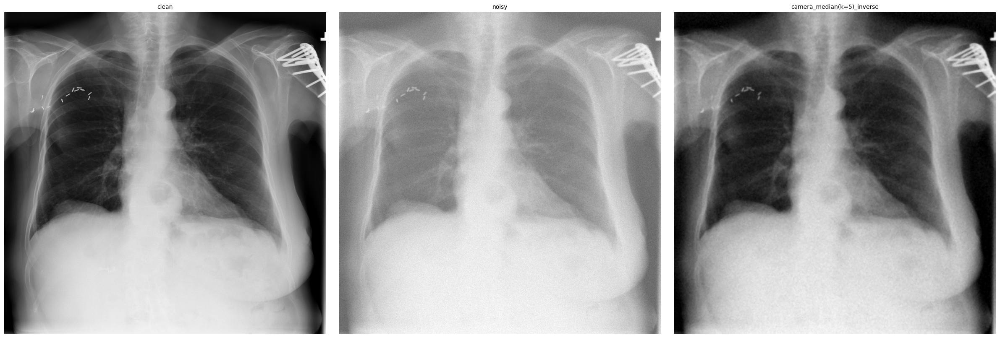

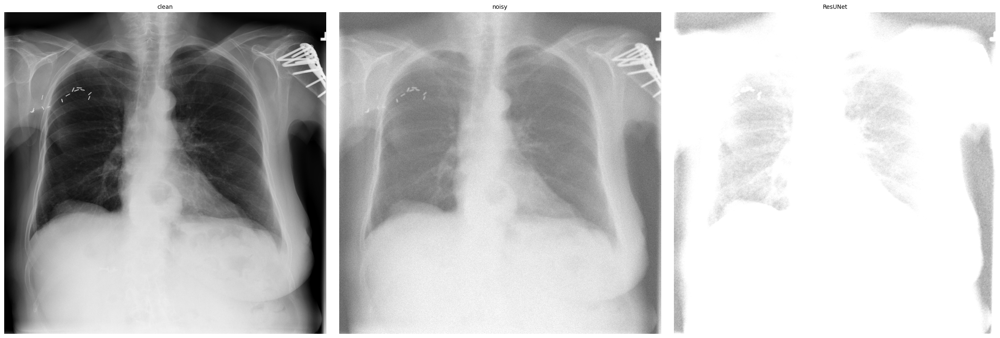

In [14]:
# show example images
for name, method in denoise_methods.items():
    clean = dataset[0][0].unsqueeze(0)
    noisy = camera_approx(clean)
    plot_cxr_images([clean, noisy, method(noisy)], ["clean", "noisy", name], figsize=(24, 8))

In [23]:
method_rocs = {}

print(len(dataset))
print(tester.diagnosis_model.targets)

roc_noise = tester.rocs(camera_approx)
roc_clean = tester.rocs()

print(f"cam AUC: {roc_noise.total_auc_score()}, clean AUC: {roc_clean.total_auc_score()}")
method_rocs["camera sim"] =roc_noise
method_rocs["clean"] = roc_clean

for name, method in denoise_methods.items():
    roc = tester.rocs(nn.Sequential(camera_approx, method))
    method_rocs[name] = roc


for name, roc in method_rocs.items():
    print(f"{name} AUC: {roc.total_auc_score()}")

    



16
['Atelectasis', 'Consolidation', 'Infiltration', 'Pneumothorax', 'Edema', 'Emphysema', 'Fibrosis', 'Effusion', 'Pneumonia', 'Pleural_Thickening', 'Cardiomegaly', 'Nodule', 'Mass', 'Hernia', 'Lung Lesion', 'Fracture', 'Lung Opacity', 'Enlarged Cardiomediastinum']


Making ROCs: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]


cam AUC: 0.505326633165829, clean AUC: 0.9555778894472362


Making ROCs: 100%|██████████| 1/1 [00:05<00:00,  5.87s/it]

camera sim AUC: 0.505326633165829
clean AUC: 0.9555778894472362
median(k=3) AUC: 0.5276381909547738
median(k=5) AUC: 0.6677386934673367
camera_inverse AUC: 0.5403015075376885
camera_inverse_median(k=5) AUC: 0.5656281407035176
camera_median(k=5)_inverse AUC: 0.5694472361809045
ResUNet AUC: 0.5145728643216081


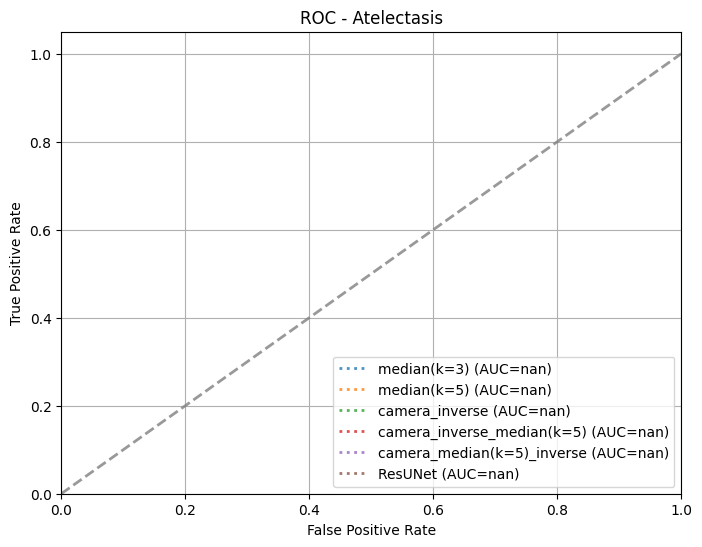

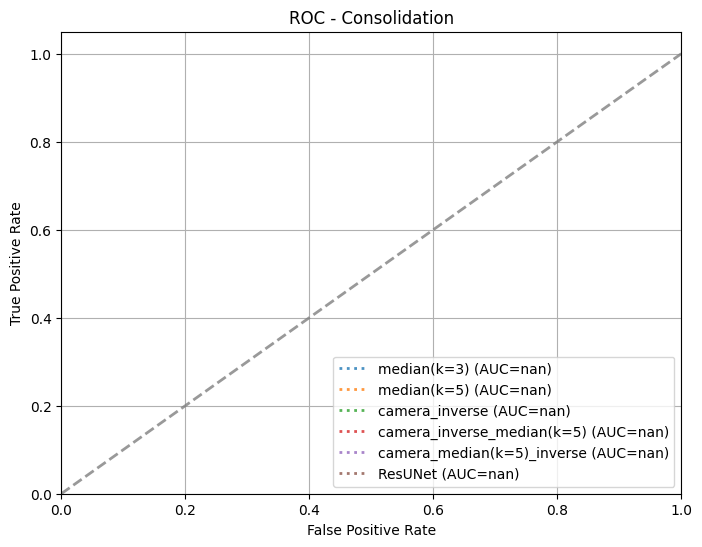

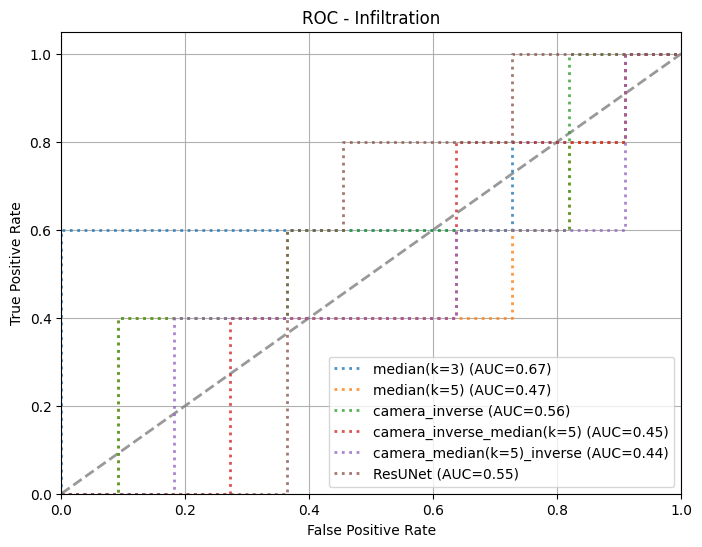

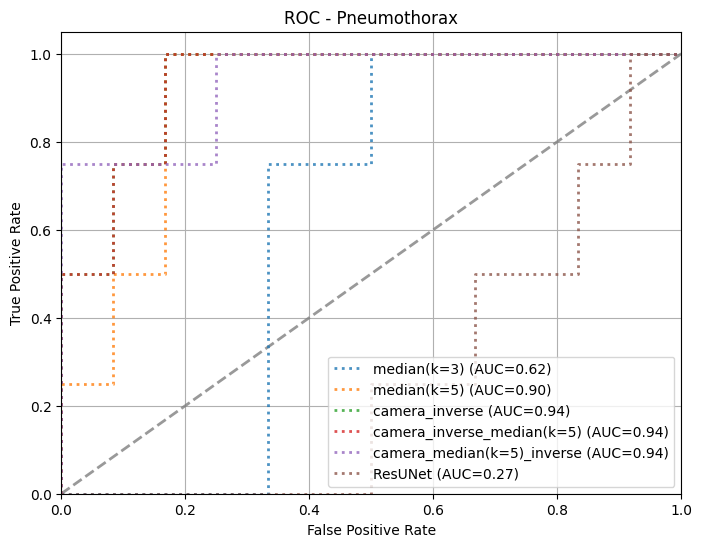

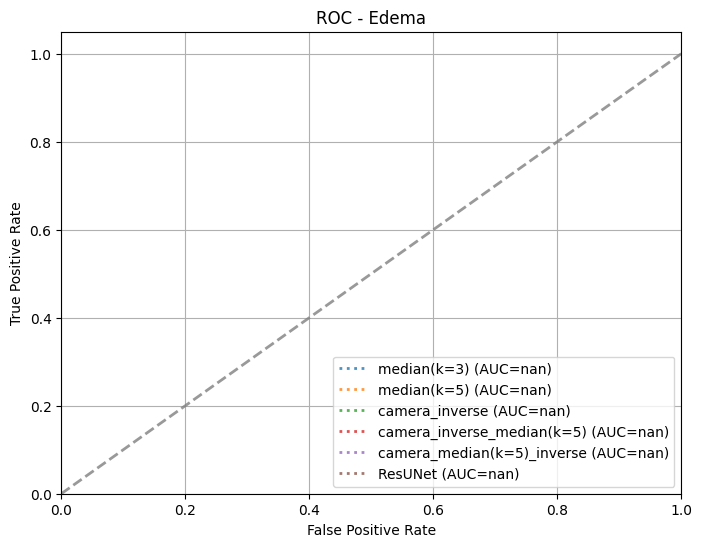

...

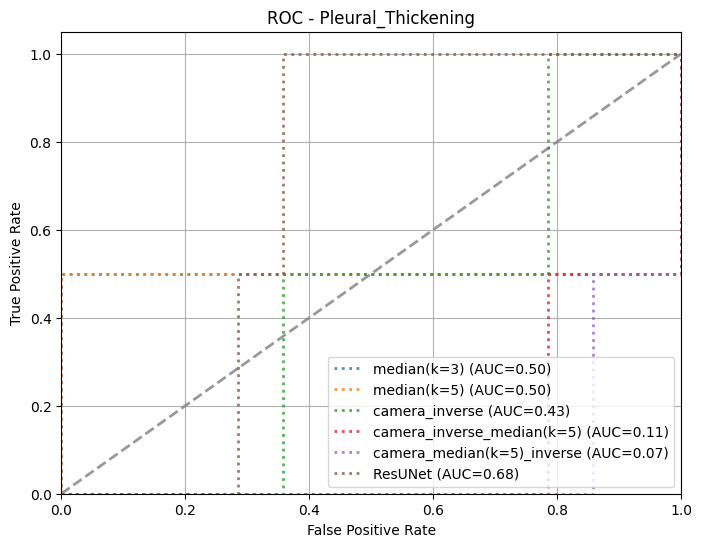

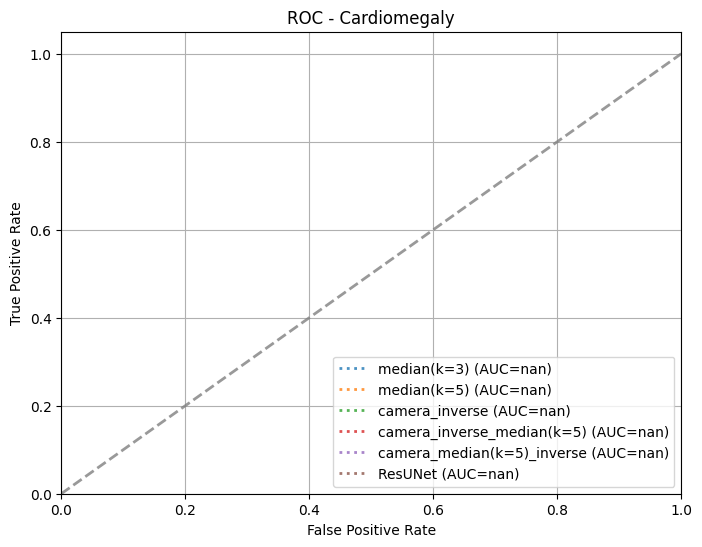

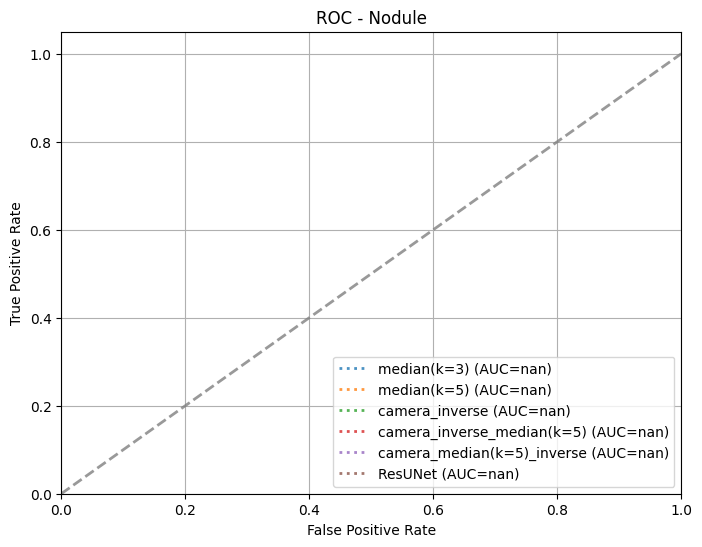

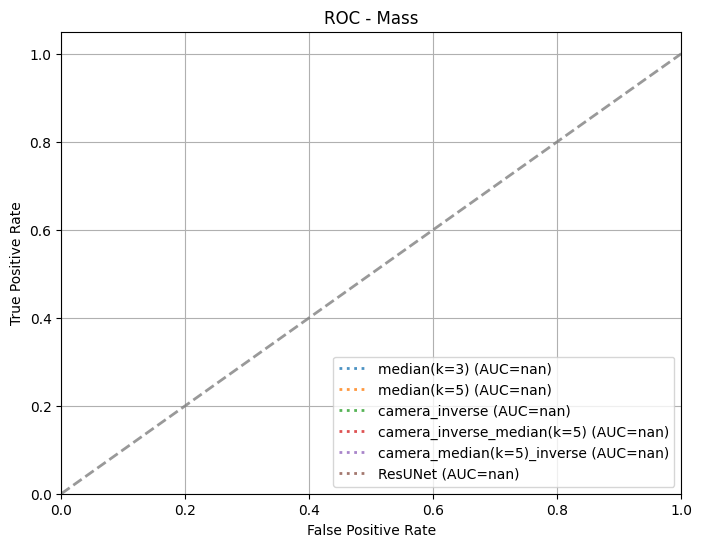

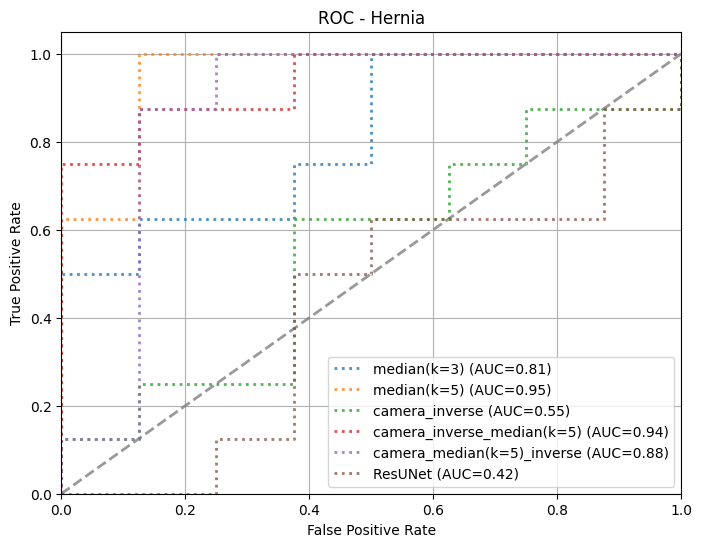

In [ ]:

for diagnosis_index in range(14):
    pathology_name = pathologies[diagnosis_index] 
    fig, ax = setup_roc_plot(f"ROC - {pathology_name}")

    add_roc_curve(ax, roc_clean.roc_fpr_tpr(diagnosis_index), label="Clean", auc_in_label=True, linestyle="-")
    add_roc_curve(ax, roc_noise.roc_fpr_tpr(diagnosis_index), label="Camera Sim", auc_in_label=True, linestyle="-")
    for name, method in denoise_methods.items():
        roc = method_rocs[name]
        add_roc_curve(ax, roc.roc_fpr_tpr(diagnosis_index), label=name, auc_in_label=True, linestyle=":")

    finalize_roc_plot(ax)

